# D_S2.0 — Metrics Analysis (Direct from S2)

Analyses the deterministic metrics computed in S2 **without permutation testing**.

- 27 families (26 signal F01–F26 + Null) × 201 SNR × 10 reps = 54,270 cases
- Null family (f(x)=0, 2,010 cases) serves as empirical null distribution
- Detection threshold: metric value exceeds 95th percentile of Null distribution

Data sources:
- `output/S1/cases.csv` + `scatter_points.npz`
- `output/S2/metrics_full.parquet`

In [231]:
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D
import seaborn as sns

warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid', font_scale=1.1)
plt.rcParams['figure.dpi'] = 120

S1_DIR = Path('output/S1')
S2_DIR = Path('output/S2')

## Load Data

In [232]:
cases = pd.read_csv(S1_DIR / 'cases.csv', low_memory=False)
metrics = pd.read_parquet(S2_DIR / 'metrics_full.parquet')

meta_cols = ['case_id', 'family_id', 'family_name', 'snr', 'spread_pattern',
             'x_distribution', 'category', 'direction', 'linearity',
             'monotonicity', 'special_shape', 'replicate']
meta = cases[[c for c in meta_cols if c in cases.columns]].copy()

df = metrics.merge(meta, on='case_id', how='left')

# Convert SNR to float for sorting
df['snr_val'] = df['snr'].apply(lambda x: float('inf') if str(x) == 'inf' else float(x))

# Signal = all 26 families (not Null)
signal = df[df['family_id'] != 'Null'].copy()
null_df = df[df['category'] == 'true_null'].copy()

print(f'Total: {len(df):,} cases')
print(f'Signal (26 families): {len(signal):,}')
print(f'Null (true_null): {len(null_df):,}')
print(f'\nFamilies: {sorted(signal["family_id"].unique())}')
print(f'SNR levels: {signal["snr_val"].nunique()} unique values')
print(f'Replicates per (family, SNR): {signal.groupby(["family_id","snr"]).size().median():.0f}')
print(f'\nMetric columns: {len(metrics.columns) - 1}')

Total: 158,790 cases
Signal (26 families): 156,780
Null (true_null): 2,010

Families: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F07', 'F08', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F17', 'F18', 'F19', 'F20', 'F21', 'F22', 'F23', 'F24', 'F25', 'F26']
SNR levels: 201 unique values
Replicates per (family, SNR): 30

Metric columns: 76


In [233]:
# Shared color palette: fresh pastels for F01–F12, muted earth tones for F13–F26
FAMILY_PALETTE = {
    'F01': '#4FC3F7',  'F02': '#29B6F6',  'F03': '#81C784',  'F04': '#26C6DA',
    'F05': '#AED581',  'F06': '#43A047',  'F07': '#F48FB1',  'F08': '#CE93D8',
    'F09': '#80DEEA',  'F10': '#80CBC4',  'F11': '#FFE082',  'F12': '#F9A825',
    'F13': '#8D6E63',  'F14': '#A1887F',  'F15': '#78909C',  'F16': '#90A4AE',
    'F17': '#C62828',  'F18': '#AD1457',  'F19': '#6A1B9A',  'F20': '#4527A0',
    'F21': '#1565C0',  'F22': '#00838F',  'F23': '#2E7D32',  'F24': '#FF7043',
    'F25': '#D84315',  'F26': '#4E342E',  'Null': '#BDBDBD',
}

## Gallery — Diverse Scatterplot Samples

A 3×6 grid sampling different function families and noise levels,
giving a quick visual sense of the variety of shapes in the dataset.

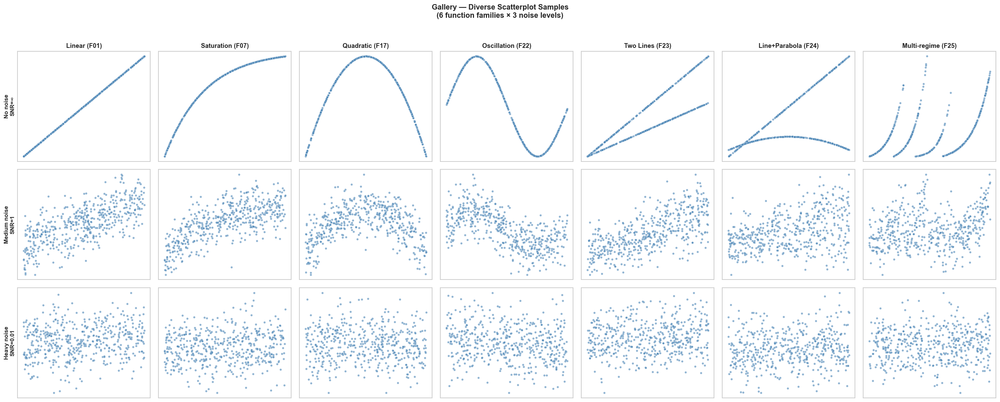

In [234]:
# ── Gallery: diverse scatterplots (7 families × 3 noise levels) ──

pts = np.load(S1_DIR / 'scatter_points.npz')
x_pts, y_pts = pts['x'], pts['y']
case_id_to_idx = dict(zip(cases['case_id'], cases.index))

gallery_families = [
    ('F01', 'Linear'),
    ('F07', 'Saturation'),
    ('F17', 'Quadratic'),
    ('F22', 'Oscillation'),
    ('F23', 'Two Lines'),
    ('F24', 'Line+Parabola'),
    ('F25', 'Multi-regime'),
]

finite_snr = sorted([s for s in signal['snr_val'].unique() if np.isfinite(s)])
gallery_snr = [
    (float('inf'), 'No noise'),
    (min(finite_snr, key=lambda s: abs(s - 1)),  'Medium noise'),
    (min(finite_snr, key=lambda s: abs(s - 0.01)), 'Heavy noise'),
]

nrows = len(gallery_snr)
ncols = len(gallery_families)

fig, axes = plt.subplots(nrows, ncols, figsize=(3.5 * ncols, 3.2 * nrows))

for ri, (sv, noise_label) in enumerate(gallery_snr):
    for ci, (fam_id, fam_label) in enumerate(gallery_families):
        ax = axes[ri, ci]

        match = df[(df['family_id'] == fam_id) &
                   (df['snr_val'] == sv) &
                   (df['replicate'] == 0)]

        if len(match) > 0:
            row = match.iloc[0]
            idx = case_id_to_idx[row['case_id']]
            x, y = x_pts[idx], y_pts[idx]
            ax.scatter(x, y, s=14, alpha=0.6, color='steelblue',
                       edgecolors='white', linewidths=0.3)

        if ri == 0:
            ax.set_title(f'{fam_label} ({fam_id})', fontsize=11, fontweight='bold')
        if ci == 0:
            snr_str = 'SNR=\u221e' if math.isinf(sv) else f'SNR={sv:.2g}'
            ax.set_ylabel(f'{noise_label}\n{snr_str}', fontsize=10, fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

fig.suptitle('Gallery \u2014 Diverse Scatterplot Samples\n'
             '(6 function families \u00d7 3 noise levels)',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

del x_pts, y_pts

## Overview — 26 Function Families + Null

5×6 grid showing one representative scatterplot per family at SNR ≈ 50.

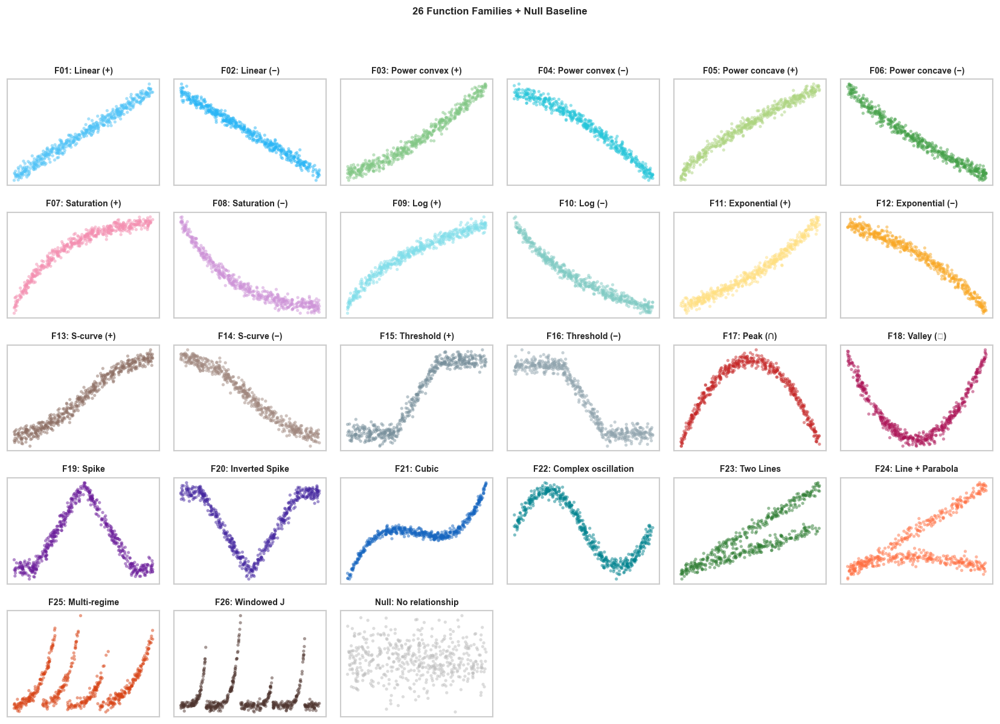

In [235]:
# ── 5×6 Overview: all 26 families + Null ──

pts = np.load(S1_DIR / 'scatter_points.npz')
x_all, y_all = pts['x'], pts['y']

overview_snr = 50.0
finite_snrs = [s for s in cases['snr'].unique()
               if str(s) != 'inf' and str(s) != 'nan']
finite_snrs = [float(s) for s in finite_snrs]
closest_overview_snr = min(finite_snrs, key=lambda s: abs(s - overview_snr))

all_family_ids = [f'F{i:02d}' for i in range(1, 27)] + ['Null']

SHORT_NAMES = {
    'F01': 'Linear (+)',       'F02': 'Linear (−)',
    'F03': 'Power convex (+)', 'F04': 'Power convex (−)',
    'F05': 'Power concave (+)','F06': 'Power concave (−)',
    'F07': 'Saturation (+)',   'F08': 'Saturation (−)',
    'F09': 'Log (+)',          'F10': 'Log (−)',
    'F11': 'Exponential (+)',  'F12': 'Exponential (−)',
    'F13': 'S-curve (+)',      'F14': 'S-curve (−)',
    'F15': 'Threshold (+)',    'F16': 'Threshold (−)',
    'F17': 'Peak (∩)',         'F18': 'Valley (∪)',
    'F19': 'Spike',            'F20': 'Inverted Spike',
    'F21': 'Cubic',            'F22': 'Complex oscillation',
    'F23': 'Two Lines',        'F24': 'Line + Parabola',
    'F25': 'Multi-regime',
    'F26': 'Windowed J',
    'Null': 'No relationship',
}

fig, axes = plt.subplots(5, 6, figsize=(14, 10))
fig.suptitle('26 Function Families + Null Baseline',
             fontsize=10, fontweight='bold', y=1.0)

for idx, (ax, fam_id) in enumerate(zip(axes.flat, all_family_ids)):
    label = SHORT_NAMES[fam_id]
    color = FAMILY_PALETTE.get(fam_id, '#5b9bd5')

    fam_cases = cases[(cases['family_id'] == fam_id) &
                      (cases['snr'] == closest_overview_snr) &
                      (cases['replicate'] == 0)]

    if len(fam_cases) > 0:
        case_idx = fam_cases.index[0]
        ax.scatter(x_all[case_idx], y_all[case_idx], s=10, alpha=0.5,
                   color=color, edgecolors='none')

    ax.set_title(f'{fam_id}: {label}', fontsize=8.5, fontweight='bold')
    ax.set_xticks([])
    ax.set_yticks([])

for ax in axes.flat[len(all_family_ids):]:
    ax.set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

del x_all, y_all, pts

## Panel C — Metric Value vs SNR by Function Family

Each subplot shows one metric. X-axis = SNR (log scale, strong→weak left→right).  
Y-axis = metric value. Each family is a colored line (mean over 10 replicates).

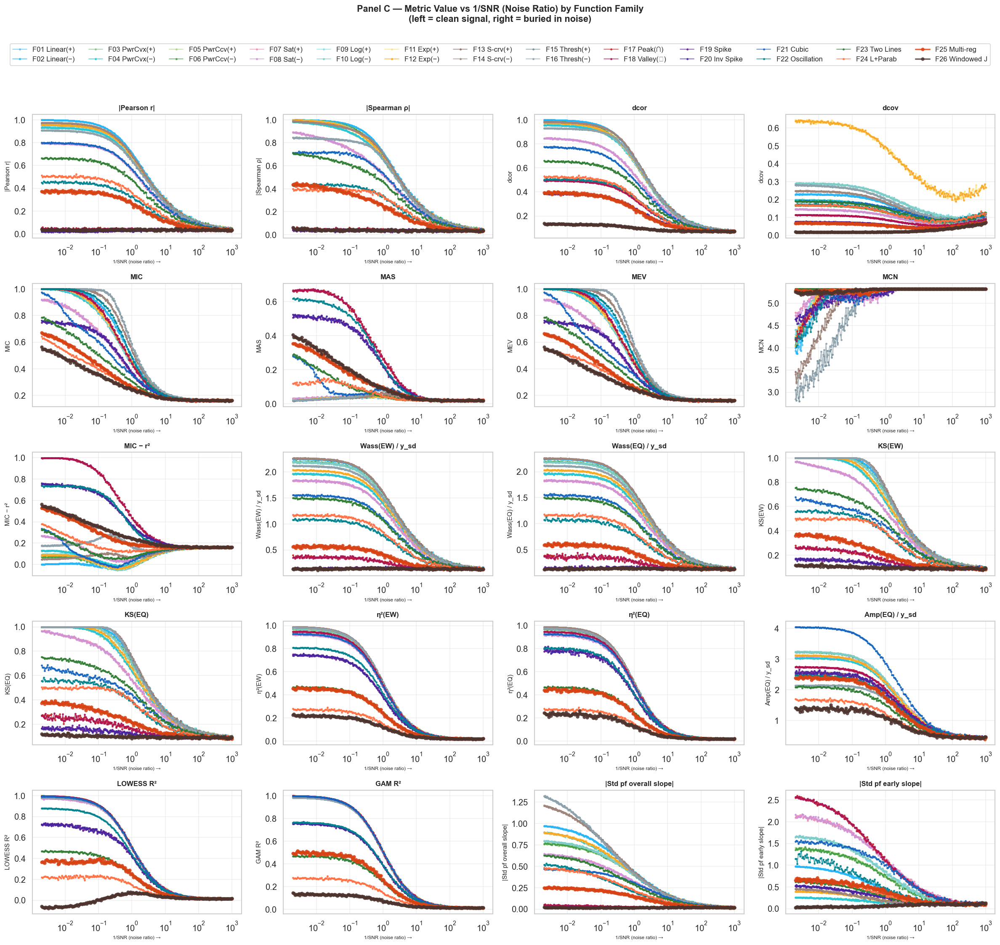

In [236]:
# ── Panel C: Metric value vs Noise Ratio (1/SNR) by function family ──

SHORT = {
    'F01': 'Linear(+)',     'F02': 'Linear(−)',     'F03': 'PwrCvx(+)',
    'F04': 'PwrCvx(−)',    'F05': 'PwrCcv(+)',     'F06': 'PwrCcv(−)',
    'F07': 'Sat(+)',        'F08': 'Sat(−)',        'F09': 'Log(+)',
    'F10': 'Log(−)',        'F11': 'Exp(+)',        'F12': 'Exp(−)',
    'F13': 'S-crv(+)',      'F14': 'S-crv(−)',      'F15': 'Thresh(+)',
    'F16': 'Thresh(−)',     'F17': 'Peak(∩)',       'F18': 'Valley(∪)',
    'F19': 'Spike',         'F20': 'Inv Spike',     'F21': 'Cubic',
    'F22': 'Oscillation',       'F23': 'Two Lines',     'F24': 'L+Parab',
    'F25': 'Multi-reg',     'F26': 'Windowed J',
}

PANEL_METRICS = [
    ('pearson_r',            '|Pearson r|'),
    ('spearman_rho',         '|Spearman ρ|'),
    ('distance_correlation', 'dcor'),
    ('distance_covariance',  'dcov'),
    ('MIC',                  'MIC'),
    ('MAS',                  'MAS'),
    ('MEV',                  'MEV'),
    ('MCN',                  'MCN'),
    ('MIC_minus_r2',         'MIC − r²'),
    ('equal_width_distribution_wasserstein_distance_div_y_sd',  'Wass(EW) / y_sd'),
    ('equal_count_distribution_wasserstein_distance_div_y_sd',  'Wass(EQ) / y_sd'),
    ('equal_width_distribution_ks_distance',                    'KS(EW)'),
    ('equal_count_distribution_ks_distance',                    'KS(EQ)'),
    ('equal_width_bin_eta_squared',             'η²(EW)'),
    ('equal_count_bin_eta_squared',             'η²(EQ)'),
    ('equal_count_bin_amplitude_div_y_sd',      'Amp(EQ) / y_sd'),
    ('lowess_r2',            'LOWESS R²'),
    ('gam_r2',              'GAM R²'),
    ('standardized_polyfit_overall_slope',  '|Std pf overall slope|'),
    ('standardized_polyfit_early_slope',    '|Std pf early slope|'),
]

ABS_METRICS = {'pearson_r', 'spearman_rho',
               'standardized_polyfit_overall_slope',
               'standardized_polyfit_early_slope'}

family_ids = sorted(signal['family_id'].unique())

ncols = 4
nrows = math.ceil(len(PANEL_METRICS) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 3.5 * nrows))
axes = axes.flatten()

for ax_i, (col, label) in enumerate(PANEL_METRICS):
    ax = axes[ax_i]
    for fid in family_ids:
        sub = signal[signal['family_id'] == fid].copy()
        vals = sub[col].copy()
        if col in ABS_METRICS:
            vals = vals.abs()
        sub = sub.assign(_val=vals)
        agg = sub.groupby('snr_val')['_val'].mean().reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        agg = agg.sort_values('noise_ratio')
        lw = 2.0 if fid in ('F25', 'F26') else 1.0
        ms = 4.0 if fid in ('F25', 'F26') else 2.0
        ax.plot(agg['noise_ratio'], agg['_val'], '-o',
                color=FAMILY_PALETTE[fid],
                markersize=ms, linewidth=lw, alpha=0.8,
                label=f'{fid} {SHORT.get(fid, "")}')
    ax.set_xscale('log')
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=7)
    ax.set_ylabel(label, fontsize=9)
    ax.set_title(label, fontweight='bold', fontsize=10)
    ax.grid(True, alpha=0.3)

for ax_i in range(len(PANEL_METRICS), len(axes)):
    axes[ax_i].set_visible(False)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=13,
           fontsize=10, frameon=True, bbox_to_anchor=(0.5, 1.03))
fig.suptitle('Panel C — Metric Value vs 1/SNR (Noise Ratio) by Function Family\n'
             '(left = clean signal, right = buried in noise)',
             fontsize=13, fontweight='bold', y=1.07)
plt.tight_layout()
plt.show()


## Panel D — Key Metrics: Fresh vs Muted Families

Top row: F01–F12 (simple monotonic/symmetric shapes).  
Bottom row: F13–F26 (complex, multi-branch, threshold shapes).

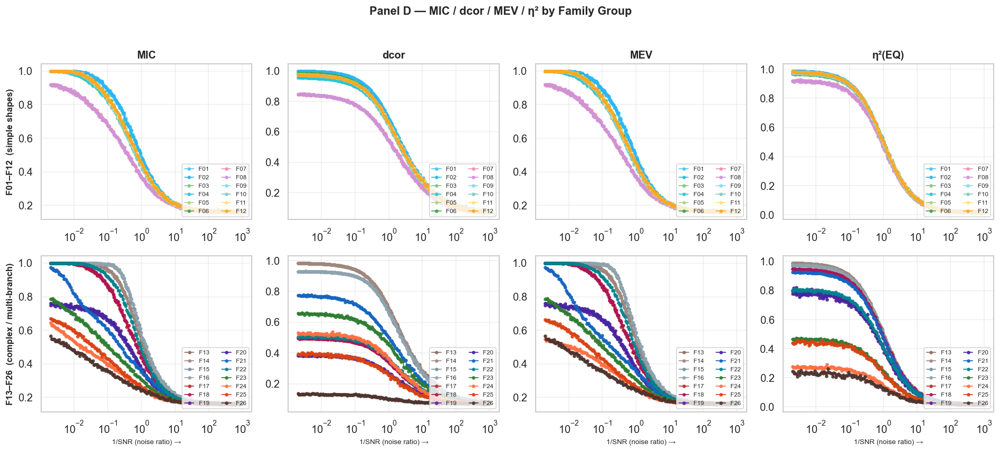

In [237]:
# ── Panel D: Key metrics split by family group ──

SPLIT_METRICS = [
    ('MIC',                  'MIC'),
    ('distance_correlation', 'dcor'),
    ('MEV',                  'MEV'),
    ('equal_count_bin_eta_squared', 'η²(EQ)'),
]

group1 = [f'F{i:02d}' for i in range(1, 13)]
group2 = [f'F{i:02d}' for i in range(13, 27)]
groups = [
    (group1, 'F01–F12  (simple shapes)'),
    (group2, 'F13–F26  (complex / multi-branch)'),
]

fig, axes = plt.subplots(2, len(SPLIT_METRICS),
                         figsize=(4 * len(SPLIT_METRICS), 3.5 * 2))

for ri, (fids, grp_label) in enumerate(groups):
    for ci, (col, label) in enumerate(SPLIT_METRICS):
        ax = axes[ri, ci]
        for fid in fids:
            sub = signal[signal['family_id'] == fid]
            agg = sub.groupby('snr_val')[col].mean().reset_index()
            agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
            agg['noise_ratio'] = 1.0 / agg['snr_val']
            agg = agg.sort_values('noise_ratio')
            ax.plot(agg['noise_ratio'], agg[col], '-o',
                    color=FAMILY_PALETTE[fid],
                    markersize=3, linewidth=1.2, alpha=0.85,
                    label=fid)
        ax.set_xscale('log')
        ax.grid(True, alpha=0.3)
        if ri == 0:
            ax.set_title(label, fontweight='bold', fontsize=12)
        if ri == 1:
            ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
        if ci == 0:
            ax.set_ylabel(grp_label, fontsize=10, fontweight='bold')
        ax.legend(fontsize=7, ncol=2, loc='lower right',
                  framealpha=0.8, handlelength=1.5)

fig.suptitle('Panel D — MIC / dcor / MEV / η² by Family Group',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


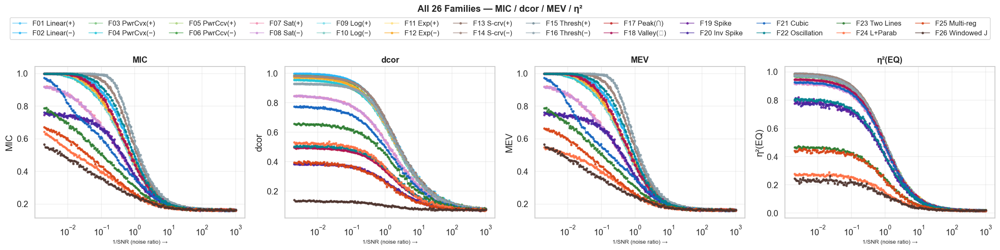


Families with mean metric ≥ 0.8 for ALL SNR ≥ 10

MIC (17 families):
  ✓ F01 (Linear(+))
  ✓ F02 (Linear(−))
  ✓ F03 (PwrCvx(+))
  ✓ F04 (PwrCvx(−))
  ✓ F05 (PwrCcv(+))
  ✓ F06 (PwrCcv(−))
  ✓ F09 (Log(+))
  ✓ F10 (Log(−))
  ✓ F11 (Exp(+))
  ✓ F12 (Exp(−))
  ✓ F13 (S-crv(+))
  ✓ F14 (S-crv(−))
  ✓ F15 (Thresh(+))
  ✓ F16 (Thresh(−))
  ✓ F17 (Peak(∩))
  ✓ F18 (Valley(∪))
  ✓ F22 (Oscillation)

dcor (14 families):
  ✓ F01 (Linear(+))
  ✓ F02 (Linear(−))
  ✓ F03 (PwrCvx(+))
  ✓ F04 (PwrCvx(−))
  ✓ F05 (PwrCcv(+))
  ✓ F06 (PwrCcv(−))
  ✓ F09 (Log(+))
  ✓ F10 (Log(−))
  ✓ F11 (Exp(+))
  ✓ F12 (Exp(−))
  ✓ F13 (S-crv(+))
  ✓ F14 (S-crv(−))
  ✓ F15 (Thresh(+))
  ✓ F16 (Thresh(−))

MEV (17 families):
  ✓ F01 (Linear(+))
  ✓ F02 (Linear(−))
  ✓ F03 (PwrCvx(+))
  ✓ F04 (PwrCvx(−))
  ✓ F05 (PwrCcv(+))
  ✓ F06 (PwrCcv(−))
  ✓ F09 (Log(+))
  ✓ F10 (Log(−))
  ✓ F11 (Exp(+))
  ✓ F12 (Exp(−))
  ✓ F13 (S-crv(+))
  ✓ F14 (S-crv(−))
  ✓ F15 (Thresh(+))
  ✓ F16 (Thresh(−))
  ✓ F17 (Peak(∩))
  ✓ F18 (Vall

In [238]:
# ── Panel D (combined): all 26 families in one plot per metric ──

SHORT = {
    'F01': 'Linear(+)',     'F02': 'Linear(−)',     'F03': 'PwrCvx(+)',
    'F04': 'PwrCvx(−)',    'F05': 'PwrCcv(+)',     'F06': 'PwrCcv(−)',
    'F07': 'Sat(+)',        'F08': 'Sat(−)',        'F09': 'Log(+)',
    'F10': 'Log(−)',        'F11': 'Exp(+)',        'F12': 'Exp(−)',
    'F13': 'S-crv(+)',      'F14': 'S-crv(−)',      'F15': 'Thresh(+)',
    'F16': 'Thresh(−)',     'F17': 'Peak(∩)',       'F18': 'Valley(∪)',
    'F19': 'Spike',         'F20': 'Inv Spike',     'F21': 'Cubic',
    'F22': 'Oscillation',       'F23': 'Two Lines',     'F24': 'L+Parab',
    'F25': 'Multi-reg',     'F26': 'Windowed J',
}

COMB_METRICS = [
    ('MIC', 'MIC'),
    ('distance_correlation', 'dcor'),
    ('MEV', 'MEV'),
    ('equal_count_bin_eta_squared', 'η²(EQ)'),
]

all_fids = [f'F{i:02d}' for i in range(1, 27)]

fig, axes = plt.subplots(1, len(COMB_METRICS), figsize=(5 * len(COMB_METRICS), 4.5))

for ax, (col, label) in zip(axes, COMB_METRICS):
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        agg = agg.sort_values('noise_ratio')
        ax.plot(agg['noise_ratio'], agg[col], '-o',
                color=FAMILY_PALETTE[fid],
                markersize=2.5, linewidth=1.0, alpha=0.8,
                label=f'{fid} {SHORT.get(fid, "")}')
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3)
    ax.set_title(label, fontweight='bold', fontsize=12)
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
    ax.set_ylabel(label)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=13,
           fontsize=10, frameon=True, bbox_to_anchor=(0.5, 1.06))
fig.suptitle('All 26 Families — MIC / dcor / MEV / η²',
             fontsize=13, fontweight='bold', y=1.10)
plt.tight_layout()
plt.show()

# ── Print families with metric ≥ 0.8 across SNR ∈ [10, ∞) ──
print('\n' + '='*70)
print('Families with mean metric ≥ 0.8 for ALL SNR ≥ 10')
print('='*70)
for col, label in COMB_METRICS:
    qualified = []
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        high_snr = agg[agg['snr_val'] >= 10]
        if len(high_snr) > 0 and high_snr[col].min() >= 0.8:
            qualified.append(f'{fid} ({SHORT[fid]})')
    print(f'\n{label} ({len(qualified)} families):')
    for q in qualified:
        print(f'  ✓ {q}')


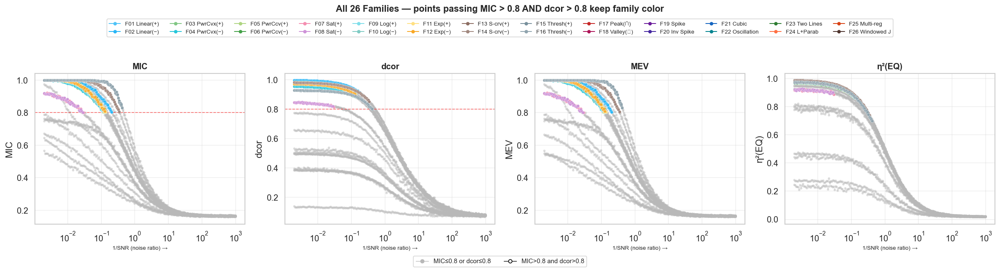

In [245]:
# ── Panel D variant: highlight family/SNR points passing MIC > 0.8 AND dcor > 0.8 ──

MIC_PASS_THRESH = 0.8
DCOR_PASS_THRESH = 0.8

fig, axes = plt.subplots(1, len(COMB_METRICS), figsize=(5 * len(COMB_METRICS), 4.5))

def _plot_true_runs(ax, x, y, mask, color, linewidth=1.2, alpha=0.9):
    """Draw colored line segments only where consecutive points both pass the mask."""
    x = np.asarray(x)
    y = np.asarray(y)
    mask = np.asarray(mask, dtype=bool)
    start = None
    for i, ok in enumerate(mask):
        if ok and start is None:
            start = i
        if (not ok or i == len(mask) - 1) and start is not None:
            end = i if ok and i == len(mask) - 1 else i - 1
            if end > start:
                ax.plot(x[start:end + 1], y[start:end + 1], '-',
                        color=color, linewidth=linewidth, alpha=alpha)
            start = None

for ax, (col, label) in zip(axes, COMB_METRICS):
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val').agg(
            value=(col, 'mean'),
            MIC_mean=('MIC', 'mean'),
            dcor_mean=('distance_correlation', 'mean'),
        ).reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        if len(agg) == 0:
            continue
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        agg = agg.sort_values('noise_ratio')
        pass_dual = (agg['MIC_mean'] > MIC_PASS_THRESH) & (agg['dcor_mean'] > DCOR_PASS_THRESH)

        # Full trajectory in gray: family/SNR pairs that do not pass remain gray.
        ax.plot(agg['noise_ratio'], agg['value'], '-',
                color='0.72', linewidth=0.8, alpha=0.35, zorder=1)
        ax.scatter(agg['noise_ratio'], agg['value'],
                   color='0.72', s=12, alpha=0.45, edgecolors='none', zorder=2)

        # Passing family/SNR pairs keep their original family color.
        passed = agg[pass_dual]
        if len(passed) > 0:
            _plot_true_runs(ax, agg['noise_ratio'], agg['value'], pass_dual,
                            FAMILY_PALETTE[fid], linewidth=1.2, alpha=0.9)
            ax.scatter(passed['noise_ratio'], passed['value'],
                       color=FAMILY_PALETTE[fid], s=18, alpha=0.9,
                       edgecolors='white', linewidths=0.25, zorder=3,
                       label=f'{fid} {SHORT.get(fid, "")}')

    if col in ['MIC', 'distance_correlation']:
        ax.axhline(0.8, color='red', linestyle='--', linewidth=1.0, alpha=0.55)
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3)
    ax.set_title(label, fontweight='bold', fontsize=12)
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
    ax.set_ylabel(label)

# Keep the family color legend, and add marker meaning.
family_handles = [Line2D([0], [0], color=FAMILY_PALETTE[f], marker='o',
                         markersize=4, linewidth=1.2,
                         label=f'{f} {SHORT.get(f, "")}' ) for f in all_fids]
status_handles = [
    Line2D([0], [0], color='0.72', marker='o', markersize=5, linewidth=0.8,
           label='MIC≤0.8 or dcor≤0.8'),
    Line2D([0], [0], color='black', marker='o', markerfacecolor='white',
           markersize=5, linewidth=0.8, label='MIC>0.8 and dcor>0.8'),
]
fig.legend(handles=family_handles, loc='upper center', ncol=13,
           fontsize=8, frameon=True, bbox_to_anchor=(0.5, 1.08))
fig.legend(handles=status_handles, loc='lower center', ncol=2,
           fontsize=9, frameon=True, bbox_to_anchor=(0.5, -0.04))
fig.suptitle('All 26 Families — points passing MIC > 0.8 AND dcor > 0.8 keep family color',
             fontsize=13, fontweight='bold', y=1.13)
plt.tight_layout()
plt.show()


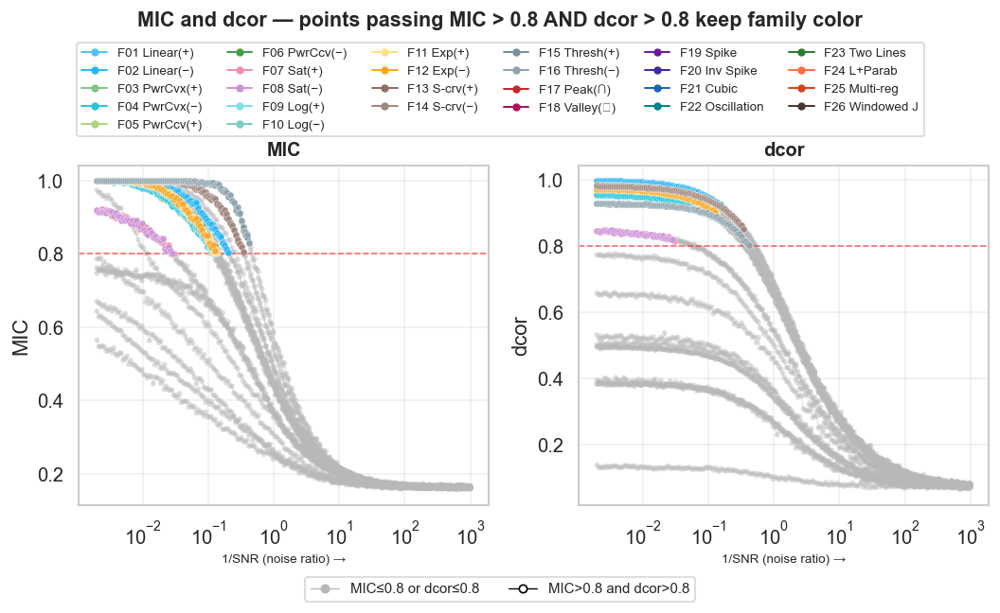

In [248]:
# ── Panel D variant: highlight family/SNR points passing MIC > 0.8 AND dcor > 0.8 ──

MIC_PASS_THRESH = 0.8
DCOR_PASS_THRESH = 0.8
HIGHLIGHT_METRICS = [
    ('MIC', 'MIC'),
    ('distance_correlation', 'dcor'),
]

fig, axes = plt.subplots(1, len(HIGHLIGHT_METRICS), figsize=(4.5 * len(HIGHLIGHT_METRICS), 4.5))
axes = np.atleast_1d(axes)

def _plot_true_runs(ax, x, y, mask, color, linewidth=1.2, alpha=0.9):
    """Draw colored line segments only where consecutive points both pass the mask."""
    x = np.asarray(x)
    y = np.asarray(y)
    mask = np.asarray(mask, dtype=bool)
    start = None
    for i, ok in enumerate(mask):
        if ok and start is None:
            start = i
        if (not ok or i == len(mask) - 1) and start is not None:
            end = i if ok and i == len(mask) - 1 else i - 1
            if end > start:
                ax.plot(x[start:end + 1], y[start:end + 1], '-',
                        color=color, linewidth=linewidth, alpha=alpha)
            start = None

for ax, (col, label) in zip(axes, HIGHLIGHT_METRICS):
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val').agg(
            value=(col, 'mean'),
            MIC_mean=('MIC', 'mean'),
            dcor_mean=('distance_correlation', 'mean'),
        ).reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        if len(agg) == 0:
            continue
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        agg = agg.sort_values('noise_ratio')
        pass_dual = (agg['MIC_mean'] > MIC_PASS_THRESH) & (agg['dcor_mean'] > DCOR_PASS_THRESH)

        ax.plot(agg['noise_ratio'], agg['value'], '-',
                color='0.72', linewidth=0.8, alpha=0.35, zorder=1)
        ax.scatter(agg['noise_ratio'], agg['value'],
                   color='0.72', s=12, alpha=0.45, edgecolors='none', zorder=2)

        passed = agg[pass_dual]
        if len(passed) > 0:
            _plot_true_runs(ax, agg['noise_ratio'], agg['value'], pass_dual,
                            FAMILY_PALETTE[fid], linewidth=1.2, alpha=0.9)
            ax.scatter(passed['noise_ratio'], passed['value'],
                       color=FAMILY_PALETTE[fid], s=18, alpha=0.9,
                       edgecolors='white', linewidths=0.25, zorder=3,
                       label=f'{fid} {SHORT.get(fid, "")}')

    ax.axhline(0.8, color='red', linestyle='--', linewidth=1.0, alpha=0.55)
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3)
    ax.set_title(label, fontweight='bold', fontsize=12)
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
    ax.set_ylabel(label)

family_handles = [Line2D([0], [0], color=FAMILY_PALETTE[f], marker='o',
                         markersize=4, linewidth=1.2,
                         label=f'{f} {SHORT.get(f, "")}' ) for f in all_fids]
status_handles = [
    Line2D([0], [0], color='0.72', marker='o', markersize=5, linewidth=0.8,
           label='MIC≤0.8 or dcor≤0.8'),
    Line2D([0], [0], color='black', marker='o', markerfacecolor='white',
           markersize=5, linewidth=0.8, label='MIC>0.8 and dcor>0.8'),
]
fig.legend(handles=family_handles, loc='upper center', ncol=6,
           fontsize=8, frameon=True, bbox_to_anchor=(0.5, 1.08))
fig.legend(handles=status_handles, loc='lower center', ncol=2,
           fontsize=9, frameon=True, bbox_to_anchor=(0.5, -0.04))
fig.suptitle('MIC and dcor — points passing MIC > 0.8 AND dcor > 0.8 keep family color',
             fontsize=13, fontweight='bold', y=1.13)
plt.tight_layout()
plt.show()


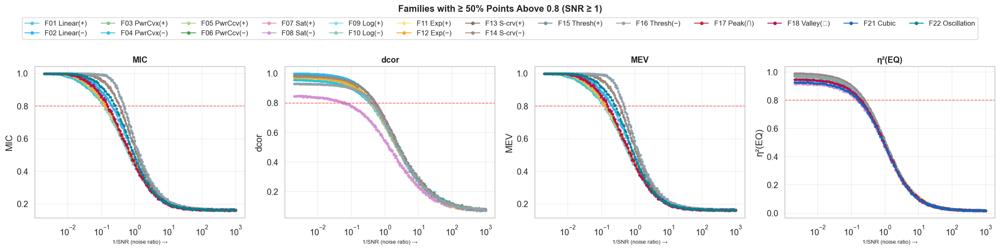

% of SNR levels (∞ → 1) where mean metric ≥ 0.8
(families with avg ≥ 50% are shown in plot above)

Rank  Family                          MIC    dcor     MEV  η²(EQ)     avg
─────────────────────────────────────────────────────────────────────────
  1★  F16 Thresh(−)                  88%    86%    88%    76%    84%
  2★  F15 Thresh(+)                  88%    86%    88%    76%    84%
  3★  F14 S-crv(−)                   83%    90%    83%    77%    83%
  4★  F13 S-crv(+)                   83%    90%    83%    77%    83%
  5★  F02 Linear(−)                  75%    90%    75%    77%    79%
  6★  F01 Linear(+)                  75%    89%    75%    77%    79%
  7★  F11 Exp(+)                     69%    85%    69%    77%    75%
  8★  F12 Exp(−)                     68%    85%    68%    78%    75%
  9★  F05 PwrCcv(+)                  69%    85%    69%    75%    74%
 10★  F06 PwrCcv(−)                  68%    85%    68%    76%    74%
 11★  F09 Log(+)                     68%    84%    68%    76%  

In [240]:
# ── Panel D (combined, filtered): families with most points ≥ 0.8 ──

THRESH = 0.8
FRAC_ABOVE = 0.5

fig, axes = plt.subplots(1, len(COMB_METRICS), figsize=(5 * len(COMB_METRICS), 4.5))

legend_fids = set()

for ax, (col, label) in zip(axes, COMB_METRICS):
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        check = agg[agg['snr_val'] >= 1]
        if len(check) == 0:
            continue
        frac = (check[col] >= THRESH).mean()
        if frac < FRAC_ABOVE:
            continue
        legend_fids.add(fid)
        agg = agg.sort_values('noise_ratio')
        ax.plot(agg['noise_ratio'], agg[col], '-o',
                color=FAMILY_PALETTE[fid],
                markersize=2.5, linewidth=1.0, alpha=0.85,
                label=f'{fid} {SHORT.get(fid, "")}')
    ax.axhline(THRESH, color='red', linestyle='--', linewidth=1.0, alpha=0.6)
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3)
    ax.set_title(label, fontweight='bold', fontsize=12)
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
    ax.set_ylabel(label)

legend_order = [f for f in all_fids if f in legend_fids]
from matplotlib.lines import Line2D
handles = [Line2D([0], [0], color=FAMILY_PALETTE[f], marker='o',
                  markersize=4, linewidth=1.2,
                  label=f'{f} {SHORT.get(f, "")}') for f in legend_order]
fig.legend(handles=handles, loc='upper center', ncol=13,
           fontsize=10, frameon=True, bbox_to_anchor=(0.5, 1.06))
fig.suptitle(f'Families with ≥ {int(FRAC_ABOVE*100)}% Points Above {THRESH} (SNR ≥ 1)',
             fontsize=13, fontweight='bold', y=1.10)
plt.tight_layout()
plt.show()

# ── Summary table: % of SNR levels (≥ 1) where metric ≥ 0.8 ──
rows = []
for fid in all_fids:
    row = {'fid': fid, 'name': SHORT[fid]}
    for col, label in COMB_METRICS:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        high = agg[agg['snr_val'] >= 1]
        if len(high) == 0:
            row[label] = 0.0
        else:
            row[label] = (high[col] >= THRESH).mean()
    rows.append(row)

tbl = pd.DataFrame(rows)
metric_cols = [label for _, label in COMB_METRICS]
tbl['avg'] = tbl[metric_cols].mean(axis=1)
tbl = tbl.sort_values('avg', ascending=False).reset_index(drop=True)

print(f'% of SNR levels (∞ → 1) where mean metric ≥ {THRESH}')
print(f'(families with avg ≥ {int(FRAC_ABOVE*100)}% are shown in plot above)\n')
header = f'{"Rank":>4}  {"Family":<28} ' + '  '.join(f'{c:>6}' for c in metric_cols) + f'  {"avg":>6}'
print(header)
print('─' * len(header))
for i, r in tbl.iterrows():
    mark = '★' if r['avg'] >= FRAC_ABOVE else ' '
    line = f'{i+1:>3}{mark}  {r["fid"] + " " + r["name"]:<28} '
    line += '  '.join(f'{r[c]:>5.0%}' for c in metric_cols)
    line += f'  {r["avg"]:>5.0%}'
    print(line)


# ── Export table to CSV ──
tbl.to_csv('output/S2/metric_above_08_summary.csv', index=False)
print(f'\nSaved to output/S2/metric_above_08_summary.csv')



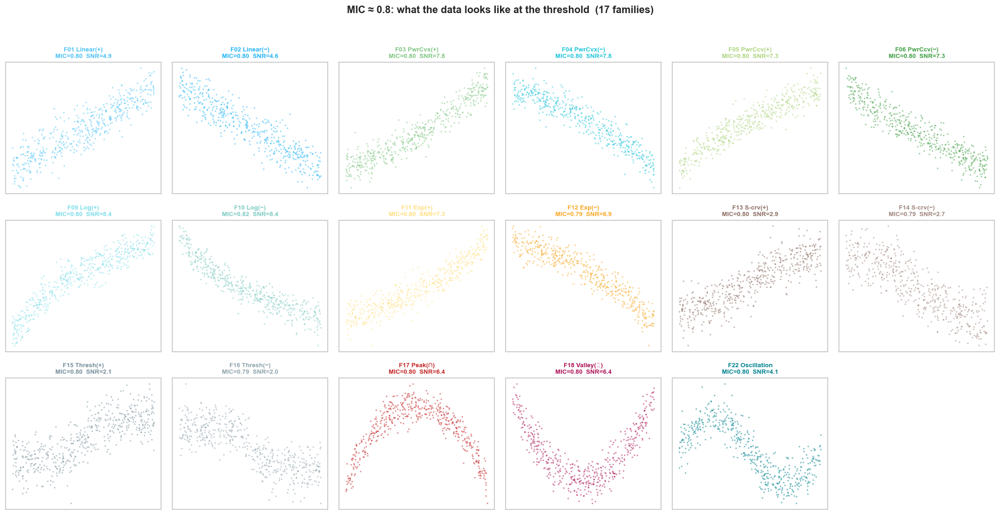

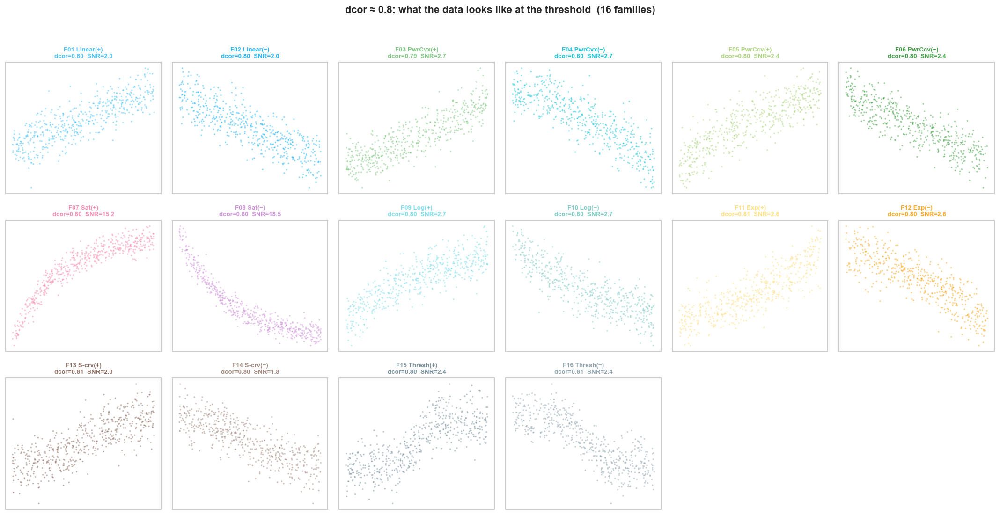

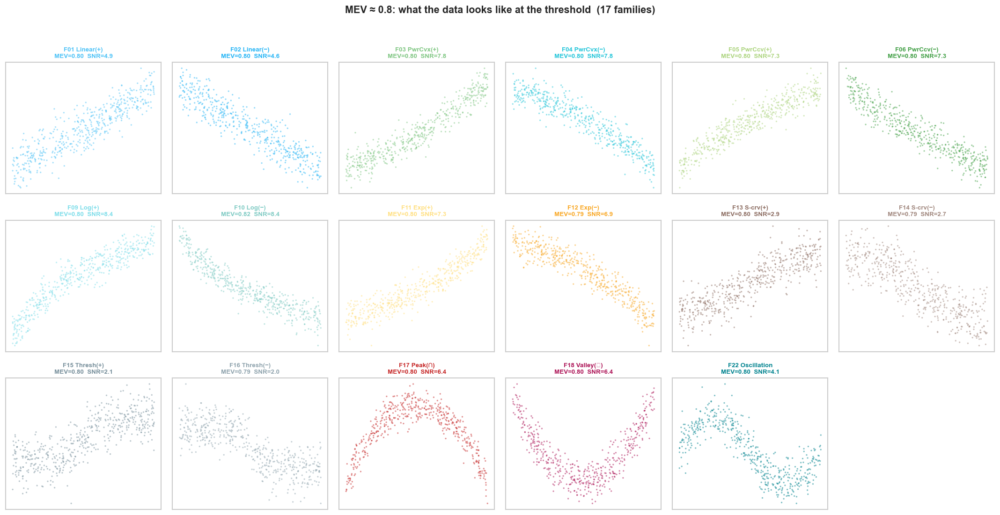

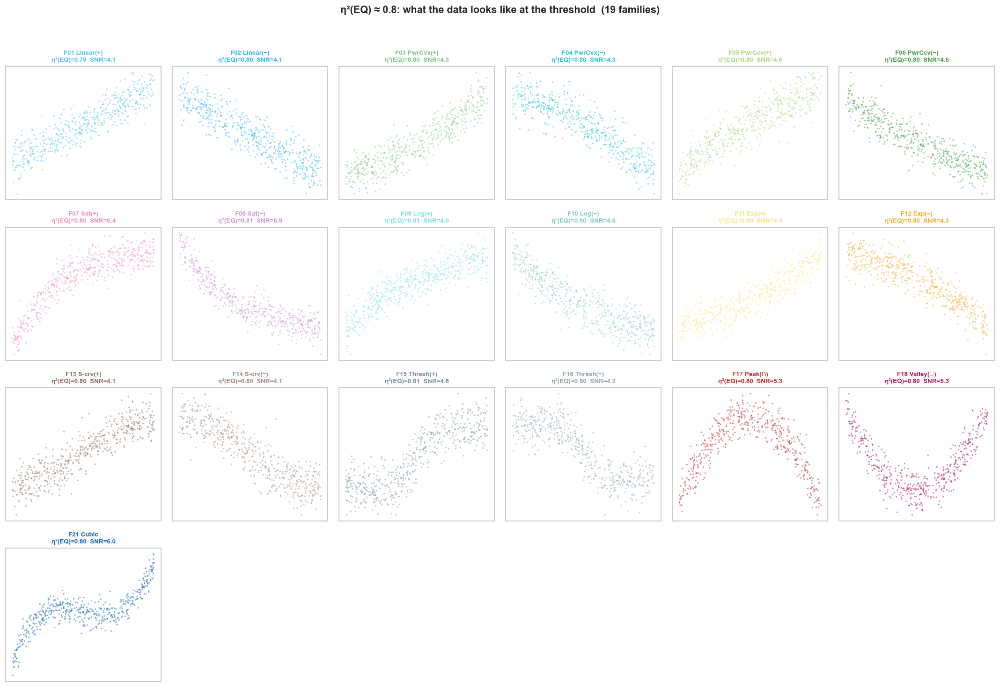

In [241]:
# ── Scatterplots at metric ≈ 0.8 for qualifying families ──

pts = np.load('output/S1/scatter_points.npz')
X_all, Y_all = pts['x'], pts['y']
cases_df = pd.read_csv('output/S1/cases.csv', low_memory=False)
cases_df['snr_f'] = cases_df['snr'].apply(lambda x: float('inf') if str(x)=='inf' else float(x))

THRESH = 0.8
FRAC_ABOVE = 0.5

for col, label in COMB_METRICS:
    qual_fids = []
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        high = agg[agg['snr_val'] >= 1]
        if len(high) == 0:
            continue
        frac = (high[col] >= THRESH).mean()
        if frac >= FRAC_ABOVE:
            qual_fids.append(fid)

    n = len(qual_fids)
    if n == 0:
        continue
    ncols_g = min(6, n)
    nrows_g = math.ceil(n / ncols_g)
    fig, axes = plt.subplots(nrows_g, ncols_g, figsize=(3 * ncols_g, 3 * nrows_g))
    if nrows_g * ncols_g == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes).reshape(nrows_g, ncols_g)

    for idx, fid in enumerate(qual_fids):
        r, c = divmod(idx, ncols_g)
        ax = axes[r, c]

        # Find the SNR level where mean metric is closest to 0.8
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        agg = agg[np.isfinite(agg['snr_val'])].copy()
        agg['diff'] = (agg[col] - THRESH).abs()
        best_snr = agg.loc[agg['diff'].idxmin(), 'snr_val']
        best_metric = agg.loc[agg['diff'].idxmin(), col]

        # Pick replicate 0 at that SNR
        fam_cases = cases_df[(cases_df['family_id'] == fid) &
                            (np.isclose(cases_df['snr_f'], best_snr, rtol=1e-6)) &
                            (cases_df['replicate'] == 0)]
        if len(fam_cases) == 0:
            fam_cases = cases_df[(cases_df['family_id'] == fid) &
                                (np.isclose(cases_df['snr_f'], best_snr, rtol=1e-3))].head(1)
        if len(fam_cases) == 0:
            ax.set_visible(False)
            continue
        ci = fam_cases.index[0]
        ax.scatter(X_all[ci], Y_all[ci], s=4, alpha=0.5,
                   color=FAMILY_PALETTE[fid], edgecolors='none')
        ax.set_title(f'{fid} {SHORT[fid]}\n{label}={best_metric:.2f}  SNR={best_snr:.1f}',
                     fontsize=8, fontweight='bold', color=FAMILY_PALETTE[fid])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(True, alpha=0.2)

    for idx in range(n, nrows_g * ncols_g):
        r, c = divmod(idx, ncols_g)
        axes[r, c].set_visible(False)

    fig.suptitle(f'{label} ≈ {THRESH}: what the data looks like at the threshold  ({n} families)',
                 fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


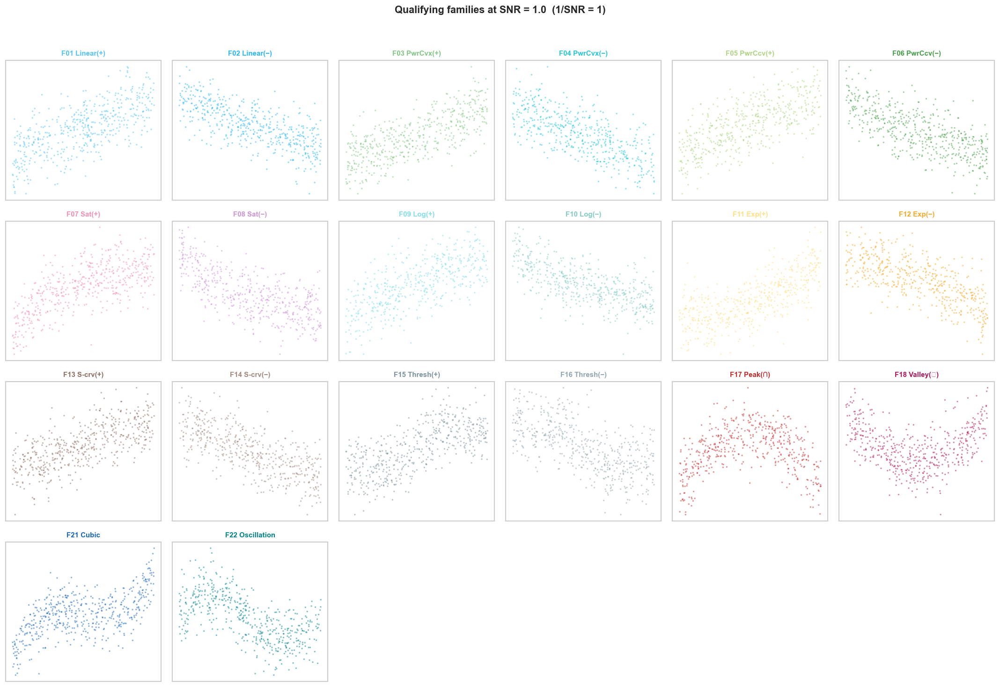

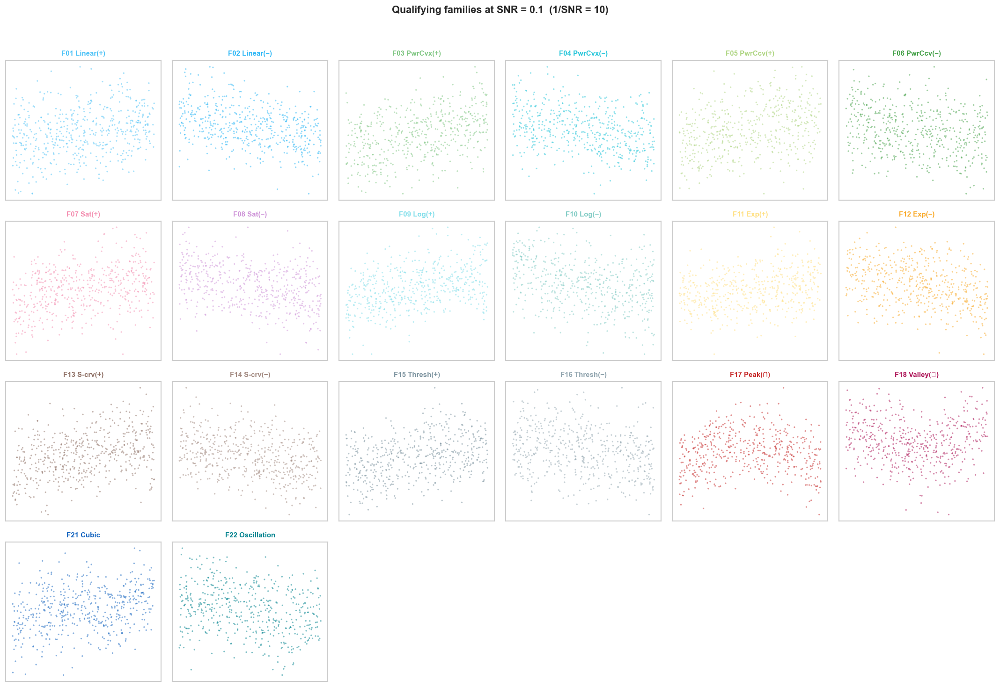

In [242]:
# ── Scatterplots of qualifying families at SNR=1 and SNR=0.1 ──

TARGET_SNRS = [1.0, 0.1]

# Collect all qualifying families (union across 4 metrics)
qual_union = set()
for col, label in COMB_METRICS:
    for fid in all_fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')[col].mean().reset_index()
        high = agg[agg['snr_val'] >= 1]
        if len(high) == 0:
            continue
        frac = (high[col] >= THRESH).mean()
        if frac >= FRAC_ABOVE:
            qual_union.add(fid)
qual_fids = sorted(qual_union)
n = len(qual_fids)

for target_snr in TARGET_SNRS:
    ncols_g = min(6, n)
    nrows_g = math.ceil(n / ncols_g)
    fig, axes = plt.subplots(nrows_g, ncols_g, figsize=(3 * ncols_g, 3 * nrows_g))
    if nrows_g * ncols_g == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes).reshape(nrows_g, ncols_g)

    for idx, fid in enumerate(qual_fids):
        r, c = divmod(idx, ncols_g)
        ax = axes[r, c]

        # Find the closest SNR to target
        fam_cases = cases_df[cases_df['family_id'] == fid].copy()
        fam_cases['snr_diff'] = (fam_cases['snr_f'] - target_snr).abs()
        closest_snr = fam_cases.loc[fam_cases['snr_diff'].idxmin(), 'snr_f']
        pick = fam_cases[(np.isclose(fam_cases['snr_f'], closest_snr, rtol=1e-6)) &
                        (fam_cases['replicate'] == 0)]
        if len(pick) == 0:
            pick = fam_cases[np.isclose(fam_cases['snr_f'], closest_snr, rtol=1e-6)].head(1)
        if len(pick) == 0:
            ax.set_visible(False)
            continue
        ci = pick.index[0]
        ax.scatter(X_all[ci], Y_all[ci], s=4, alpha=0.5,
                   color=FAMILY_PALETTE[fid], edgecolors='none')
        ax.set_title(f'{fid} {SHORT[fid]}', fontsize=9, fontweight='bold',
                     color=FAMILY_PALETTE[fid])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(True, alpha=0.2)

    for idx in range(n, nrows_g * ncols_g):
        r, c = divmod(idx, ncols_g)
        axes[r, c].set_visible(False)

    fig.suptitle(f'Qualifying families at SNR = {target_snr}  (1/SNR = {1/target_snr:g})',
                 fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


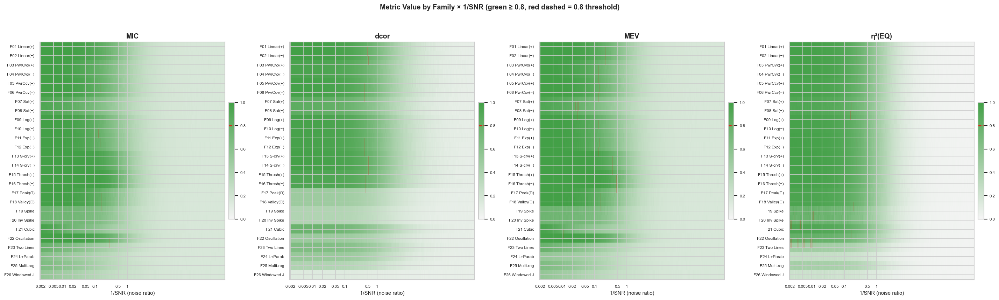

In [243]:
# ── Panel D (heatmap): families × 1/SNR — metric ≥ 0.8 indicator ──

HEAT_METRICS = [
    ('MIC', 'MIC'),
    ('distance_correlation', 'dcor'),
    ('MEV', 'MEV'),
    ('equal_count_bin_eta_squared', 'η²(EQ)'),
]

all_fids = [f'F{i:02d}' for i in range(1, 27)]

SHORT_H = {
    'F01': 'Linear(+)',     'F02': 'Linear(−)',     'F03': 'PwrCvx(+)',
    'F04': 'PwrCvx(−)',    'F05': 'PwrCcv(+)',     'F06': 'PwrCcv(−)',
    'F07': 'Sat(+)',        'F08': 'Sat(−)',        'F09': 'Log(+)',
    'F10': 'Log(−)',        'F11': 'Exp(+)',        'F12': 'Exp(−)',
    'F13': 'S-crv(+)',      'F14': 'S-crv(−)',      'F15': 'Thresh(+)',
    'F16': 'Thresh(−)',     'F17': 'Peak(∩)',       'F18': 'Valley(∪)',
    'F19': 'Spike',         'F20': 'Inv Spike',     'F21': 'Cubic',
    'F22': 'Oscillation',       'F23': 'Two Lines',     'F24': 'L+Parab',
    'F25': 'Multi-reg',     'F26': 'Windowed J',
}

sig = signal[np.isfinite(signal['snr_val']) & (signal['snr_val'] > 0)].copy()
sig['noise_ratio'] = 1.0 / sig['snr_val']
nr_levels = sorted(sig['noise_ratio'].unique())

from matplotlib.colors import LinearSegmentedColormap
cmap_bin = LinearSegmentedColormap.from_list('bin08', ['#F5F5F5', '#43A047'], N=256)

fig, axes = plt.subplots(1, len(HEAT_METRICS), figsize=(6 * len(HEAT_METRICS), 7))

for ax, (col, label) in zip(axes, HEAT_METRICS):
    mat = np.full((len(all_fids), len(nr_levels)), np.nan)
    for i, fid in enumerate(all_fids):
        sub = sig[sig['family_id'] == fid]
        agg = sub.groupby('noise_ratio')[col].mean()
        for j, nr in enumerate(nr_levels):
            if nr in agg.index:
                mat[i, j] = agg[nr]

    im = ax.imshow(mat, aspect='auto', vmin=0, vmax=1, cmap=cmap_bin,
                   interpolation='nearest')

    for i in range(len(all_fids)):
        row = mat[i]
        for j in range(len(nr_levels) - 1):
            if (row[j] >= 0.8 and row[j+1] < 0.8) or (row[j] < 0.8 and row[j+1] >= 0.8):
                ax.axvline(j + 0.5, ymin=(len(all_fids) - i - 1.5) / len(all_fids),
                           ymax=(len(all_fids) - i - 0.5) / len(all_fids),
                           color='red', linewidth=0.3, alpha=0.4)

    tick_nrs = [0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.5, 1.0]
    tick_pos = []
    tick_lab = []
    for tn in tick_nrs:
        closest = min(range(len(nr_levels)), key=lambda j: abs(nr_levels[j] - tn))
        tick_pos.append(closest)
        tick_lab.append(f'{tn:g}')
    ax.set_xticks(tick_pos)
    ax.set_xticklabels(tick_lab, fontsize=7)
    ax.set_xlabel('1/SNR (noise ratio)', fontsize=9)

    ax.set_yticks(range(len(all_fids)))
    ax.set_yticklabels([f'{f} {SHORT_H[f]}' for f in all_fids], fontsize=7)
    ax.set_title(label, fontweight='bold', fontsize=12)

    cbar = fig.colorbar(im, ax=ax, fraction=0.03, pad=0.02)
    cbar.ax.axhline(0.8, color='red', linewidth=1.5, linestyle='--')
    cbar.ax.tick_params(labelsize=7)

fig.suptitle('Metric Value by Family × 1/SNR (green ≥ 0.8, red dashed = 0.8 threshold)',
             fontsize=12, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


## Panel E — MCN by Family Group

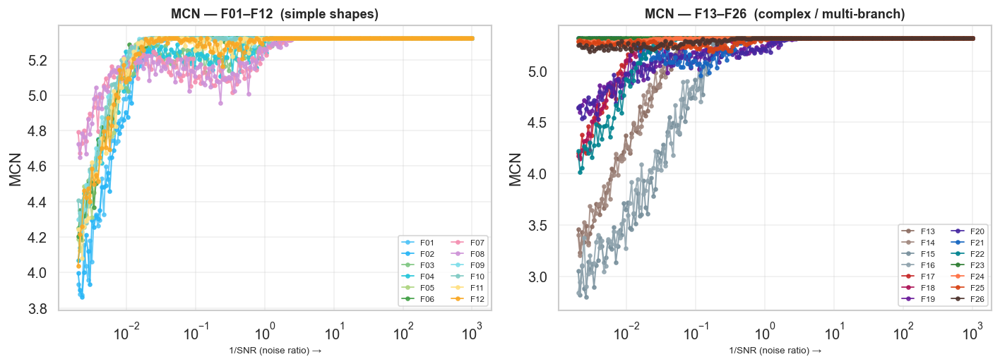

In [244]:
# ── Panel E: MCN split by family group ──

group1 = [f'F{i:02d}' for i in range(1, 13)]
group2 = [f'F{i:02d}' for i in range(13, 27)]
groups = [
    (group1, 'F01–F12  (simple shapes)'),
    (group2, 'F13–F26  (complex / multi-branch)'),
]

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))

for ax, (fids, grp_label) in zip(axes, groups):
    for fid in fids:
        sub = signal[signal['family_id'] == fid]
        agg = sub.groupby('snr_val')['MCN'].mean().reset_index()
        agg = agg[np.isfinite(agg['snr_val']) & (agg['snr_val'] > 0)].copy()
        agg['noise_ratio'] = 1.0 / agg['snr_val']
        agg = agg.sort_values('noise_ratio')
        ax.plot(agg['noise_ratio'], agg['MCN'], '-o',
                color=FAMILY_PALETTE[fid],
                markersize=3, linewidth=1.2, alpha=0.85,
                label=fid)
    ax.set_xscale('log')
    ax.grid(True, alpha=0.3)
    ax.set_title(f'MCN — {grp_label}', fontweight='bold', fontsize=11)
    ax.set_xlabel('1/SNR (noise ratio) →', fontsize=8)
    ax.set_ylabel('MCN')
    ax.legend(fontsize=7, ncol=2, loc='best', framealpha=0.8, handlelength=1.5)

plt.tight_layout()
plt.show()
